# Visualizing VGG at different layers

## 1 Load VGG and test on some images
https://machinelearningmastery.com/use-pre-trained-vgg-model-classify-objects-photographs/
We used the above guide to load VGG and use it.

We chose VGG because it is a completely feed forward network. This makes the analysis of circuits much simpler and easier to do. Also VGG is conveniently trained in keras applications so it was easy to get up and running very quickly. Lastly, VGG is a good example because it is so heavily used. Describing what it learned is useful an many places.

In [1]:
from tensorflow import keras
from matplotlib import pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
import tensorflow as tf
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.applications.vgg19 import decode_predictions
import numpy as np
import matplotlib as mpl
from tqdm.auto import tqdm

In [2]:
print('TensorFlow', tf.__version__)
print('keras', keras.__version__)
print('numpy', np.__version__)
print('matplotlib ', mpl.__version__)

TensorFlow 2.1.0
keras 2.2.4-tf
numpy 1.19.2
matplotlib  3.5.0


In [3]:
model = tf.keras.applications.vgg19.VGG19()

In [4]:
model.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

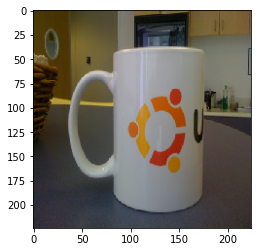

In [5]:
from matplotlib import pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
image1 = load_img('UbuntuMug.jpg', target_size=(224, 224))
plt.imshow(image1)

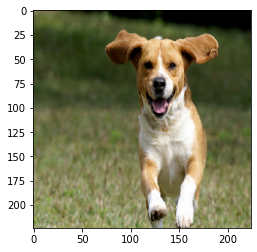

In [6]:
image2 = load_img('dog.jpeg', target_size=(224, 224))
plt.imshow(image2)

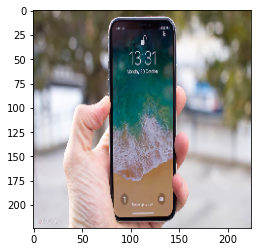

In [7]:
image3 = load_img('iphone.jpg', target_size=(224, 224))
plt.imshow(image3)

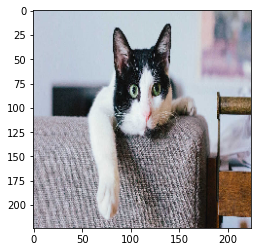

In [8]:
image4 = load_img('cat.jpg', target_size=(224, 224))
plt.imshow(image4)

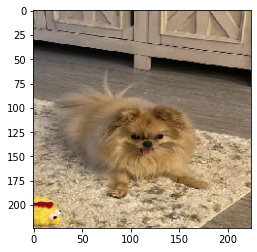

In [9]:
image5 = load_img('gigi.jpg', target_size=(224, 224))
plt.imshow(image5)

In [10]:
images = [image1, image2, image3, image4, image5]
for image in images:
    image_np = img_to_array(image)
    image_np = image_np.reshape((1, image_np.shape[0],
                                 image_np.shape[1],
                                 image_np.shape[2]))
    image_np = preprocess_input(image_np)
    
    yhat = model.predict(image_np)
    label = decode_predictions(yhat)
    label = label[0][0]
    print(f"{label[1]}, with certainty {label[2]*100}")
    
    

coffee_mug, with certainty 85.14823913574219
golden_retriever, with certainty 14.151574671268463
iPod, with certainty 79.24851775169373
basenji, with certainty 38.22553753852844
Pomeranian, with certainty 89.97217416763306


In [11]:
for layer in model.layers:
    print(layer.name)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool
flatten
fc1
fc2
predictions


In [161]:
class LayerAnalyzer:
    """
    This class takes a model and a target layer, then allows the user to get 
    an input image that maximmally excites one of the multi-channel filters 
    of that layer. The techniques came from:
    https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/chapter09_part03_interpreting-what-convnets-learn.ipynb
    """
    def __init__(self, model, layer_name, img_width = 224, img_height = 224):
        self.model = model
        self.layer_name = layer_name
        layer = model.get_layer(name=layer_name)
        self.feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)
        self.img_width = img_width
        self.img_height = img_height        
        
    """ 
    Compute the loss of the activations of the given layer. 
    Since we are using gradient ascent, it is just the mean of the activations.
    """
    def compute_loss(self, image, filter_index):
        activation = self.feature_extractor(image)
        filter_activation = activation[:, 2:-2, 2:-2, filter_index]
        return tf.reduce_mean(filter_activation)

    @tf.function
    def gradient_ascent_step(self, image, filter_index, learning_rate):
        with tf.GradientTape() as tape:
            tape.watch(image)
            loss = self.compute_loss(image, filter_index)
        grads = tape.gradient(loss, image)
        grads = tf.math.l2_normalize(grads)
        image += learning_rate * grads
        return image
    
    def generate_filter_pattern(self, filter_index, learning_rate = 10., iterations = 30):
        image = tf.random.uniform(
            minval=0.4,
            maxval=0.6,
            shape=(1, self.img_width, self.img_height, 3))
        layer = model.get_layer(name=self.layer_name)
        for i in range(iterations):
            image = self.gradient_ascent_step(image, filter_index, learning_rate)
        return image[0].numpy()

    def get_image_size(self):
        return (self.img_width, self.img_height)

In [156]:
def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]
    return image

Wall time: 2.21 s


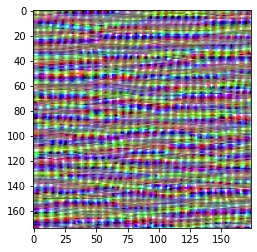

In [14]:
%%time
analyzer = LayerAnalyzer(model, "block3_conv3")
plt.imshow(deprocess_image(analyzer.generate_filter_pattern(2, iterations=200)))

## Plot all of a layer

In [45]:
def plot_gallery(images, titles, h, w, n_row=3, n_col=6, skip=0, step=1, cmap='bone', vmin=None, vmax=None,
                hspace=0, wspace=None):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row *0.8))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=hspace, wspace=wspace)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[(i * step) + skip],cmap=cmap, vmin=vmin, vmax=vmax)
        plt.axis('off')
        plt.title(titles[i])
    plt.show()

Channels running:   0%|          | 0/256 [00:00<?, ?it/s]

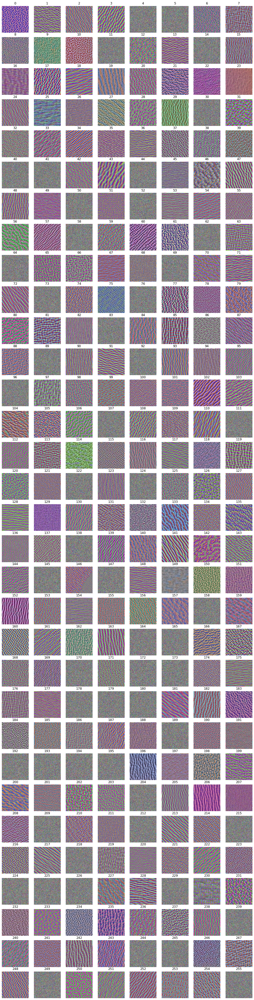

Wall time: 5min 18s


In [16]:
%%time
from tqdm.auto import tqdm
def plot_entire_layer(layer_name, nchannels):
    images = []
    analyzer = LayerAnalyzer(model, layer_name)
    
    pbar = tqdm(desc="Channels running: ", total=nchannels)
    for i in range(nchannels):
        images.append(deprocess_image(
            analyzer.generate_filter_pattern(filter_index=i,
                                             learning_rate=10.,
                                             iterations=200)))
        pbar.update(1)
        
    plot_gallery(images,
                 [i for i in range(nchannels)],
                 analyzer.get_image_size()[0],
                 analyzer.get_image_size()[1],
                 n_row=nchannels//8,
                 n_col=8)
        
    return images

images = plot_entire_layer("block3_conv2", 256)

We think filter 36 looks interesting, we will run that one and plot it bigger

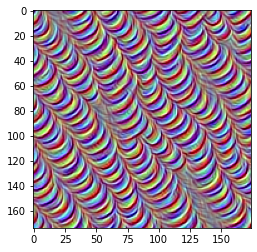

In [19]:
analyzer = LayerAnalyzer(model, "block3_conv2")
plt.imshow(deprocess_image(analyzer.generate_filter_pattern(210, iterations=200)))

In [45]:
def plot_gallery(images, titles, h, w, n_row=3, n_col=6, skip=0, step=1, cmap='bone', vmin=None, vmax=None,
                hspace=0, wspace=None):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row *0.8))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=hspace, wspace=wspace)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[(i * step) + skip],cmap=cmap, vmin=vmin, vmax=vmax)
        plt.axis('off')
        plt.title(titles[i])
    plt.show()

## Look at the iPhones activations from this filter

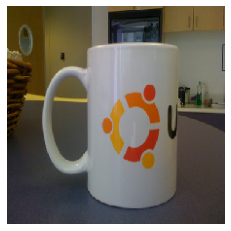

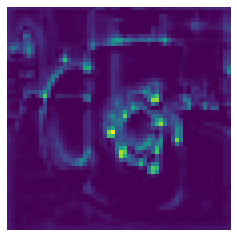

In [86]:
array = img_to_array(image1)
array = np.expand_dims(array, axis=0)

activations = analyzer.feature_extractor(array)


plt.imshow(image1)
plt.axis('off')

plt.matshow(activations[0, :, :, 5], cmap="viridis")
plt.axis('off')
plt.show()


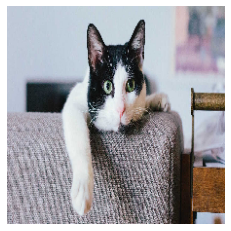

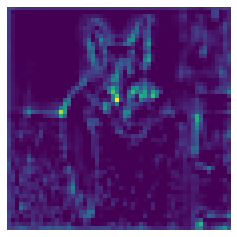

In [87]:
array = img_to_array(image4)
array = np.expand_dims(array, axis=0)

activations = analyzer.feature_extractor(array)


plt.imshow(image4)
plt.axis('off')

plt.matshow(activations[0, :, :, 5], cmap="viridis")
plt.axis('off')
plt.show()


## Look at the input filters to this layer
The input to block3_conv2 is 256 channels, so we will look at 256 3x3 filters 

In [88]:
layer_3_2 = model.get_layer("block3_conv2")
filter_number = 210

filters, biases = layer_3_2.get_weights()
image_filters = []
for i in range (0, filters.shape[-2]):
    image_filters.append(filters[:, :, i, filter_number])
    
image_filters = np.array(image_filters)

In [89]:
l2_norms = np.array([np.sqrt(
                     np.mean(
                     np.square(
                         image_filters[i]))) for i in range(0, filters.shape[-1])])

In [90]:
print(image_filters.min(), image_filters.max())

-0.088702366 0.17525071


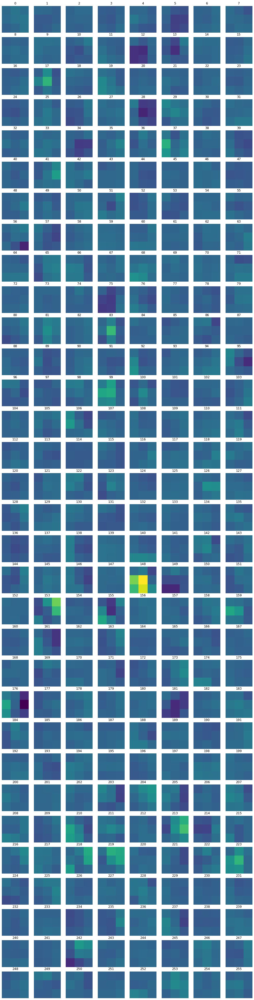

In [91]:
plot_gallery(image_filters, [i for i in range(256)], 3, 3, n_col=8, n_row=32, cmap='viridis',
            vmin=image_filters.min(), vmax=image_filters.max())

In [92]:
top_6_idxs = np.argsort(l2_norms)[-6:]
top_6_idxs

array([ 99, 219, 176, 213, 153, 148], dtype=int64)

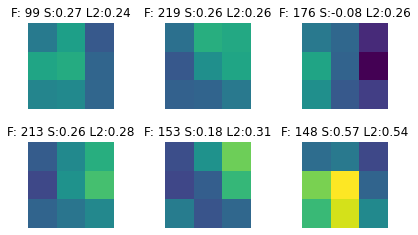

In [54]:
top_6_idxs = np.argsort(l2_norms)[-6:]

headers = ['F: %d S:%.2f L2:%.2f' % (i, sums[i], l2_norms[i]) for i in top_6_idxs]

sums = np.array([np.sum(image_filters[i]) for i in range(0, filters.shape[-1])])
plot_gallery(image_filters[top_6_idxs], headers, 1, 3, n_col=3, n_row=2, cmap='viridis',
            vmin=image_filters.min(), vmax=image_filters.max(), wspace=0.6)

The filters with the highest L2 norms are 99, 219, 176, 213, 153, 148, above shows their filter number, sum, and L2 norm in that order for each filter. 99, 219, 213, 153, and 148 are mostly positive, while 176 is mostly negative.

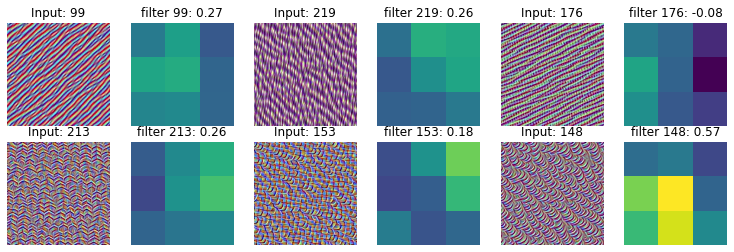

Wall time: 8.86 s


In [110]:
%%time
images = []
headers = []
nchannels = 256
analyzer = LayerAnalyzer(model, "block3_conv1")
for idx in top_6_idxs:
    images.append(deprocess_image(analyzer.generate_filter_pattern(idx,
                                                                   learning_rate=5,
                                                                   iterations=300)))
    headers.append("Input: %d" % idx)
    
    images.append(image_filters[idx])
    headers.append("filter %d: %.2f" % (idx, sums[idx]))
    
    
plot_gallery(images,
             headers,
             analyzer.get_image_size()[0],
             analyzer.get_image_size()[1],
             n_row=2,
             n_col=6,
             cmap='viridis',
             vmin=image_filters.min(), vmax=image_filters.max())

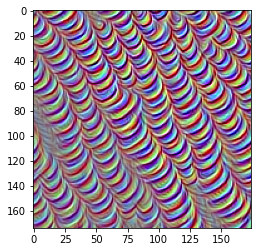

In [95]:
analyzer = LayerAnalyzer(model, "block3_conv2")
plt.imshow(deprocess_image(analyzer.generate_filter_pattern(210, iterations=200)))

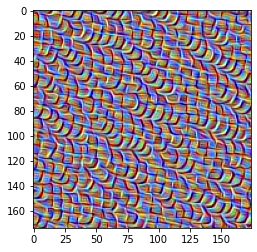

In [112]:
analyzer = LayerAnalyzer(model, "block3_conv1")
plt.imshow(deprocess_image(analyzer.generate_filter_pattern(153, iterations=200)))

Channels running:   0%|          | 0/100 [00:00<?, ?it/s]

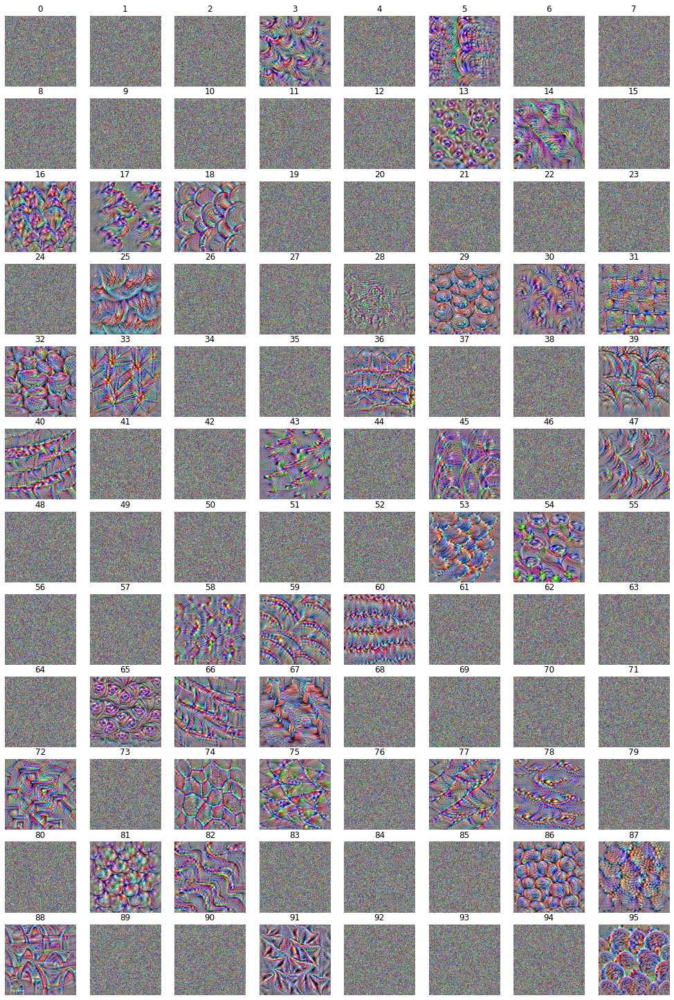

In [162]:
# just going to look at the first 100 to find an interesting one
images = plot_entire_layer("block5_conv1", 100)

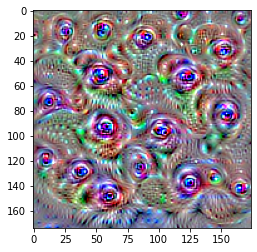

In [164]:
analyzer = LayerAnalyzer(model, "block5_conv1")
deproc_image = deprocess_image(analyzer.generate_filter_pattern(13, iterations=200))
plt.imshow(deproc_image)

In [165]:
layer_5_1 = model.get_layer("block5_conv1")
filter_number = 13

filters, biases = layer_5_1.get_weights()
image_filters = []
for i in range (0, filters.shape[-2]):
    image_filters.append(filters[:, :, i, filter_number])
    
image_filters = np.array(image_filters)

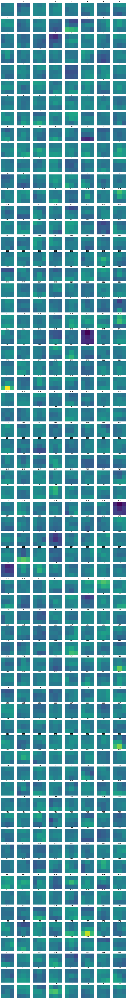

In [167]:
plot_gallery(image_filters, [i for i in range(512)], 3, 3, n_col=8, n_row=64, cmap='viridis',
            vmin=image_filters.min(), vmax=image_filters.max())

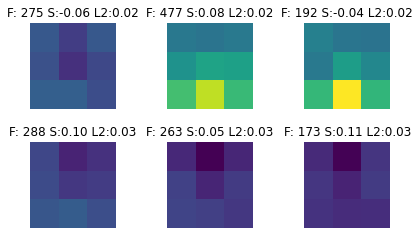

In [168]:
l2_norms = np.array([np.sqrt(
                     np.mean(
                     np.square(
                         image_filters[i]))) for i in range(0, filters.shape[-1])])

top_6_idxs = np.argsort(l2_norms)[-6:]

headers = ['F: %d S:%.2f L2:%.2f' % (i, sums[i], l2_norms[i]) for i in top_6_idxs]

sums = np.array([np.sum(image_filters[i]) for i in range(0, filters.shape[-1])])
plot_gallery(image_filters[top_6_idxs], headers, 1, 3, n_col=3, n_row=2, cmap='viridis',
            vmin=image_filters.min(), vmax=image_filters.max(), wspace=0.6)

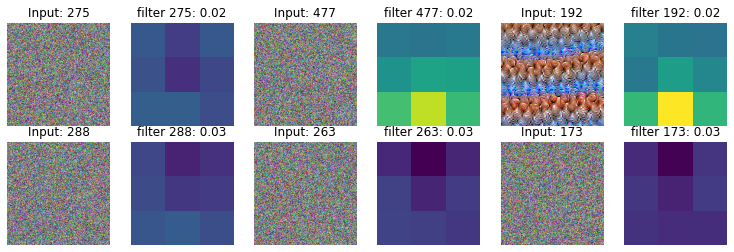

Wall time: 3min 46s


In [170]:
%%time
images = []
headers = []
analyzer = LayerAnalyzer(model, "block4_conv4")
for idx in top_6_idxs:
    images.append(deprocess_image(
        analyzer.generate_filter_pattern(idx,
                                         learning_rate=.1,
                                         iterations=3000)))
    headers.append("Input: %d" % idx)
    
    images.append(image_filters[idx])
    headers.append("filter %d: %.2f" % (idx, l2_norms[idx]))
    
    
plot_gallery(images,
             headers,
             analyzer.get_image_size()[0],
             analyzer.get_image_size()[1],
             n_row=2,
             n_col=6,
             cmap='viridis',
             vmin=image_filters.min(), vmax=image_filters.max())

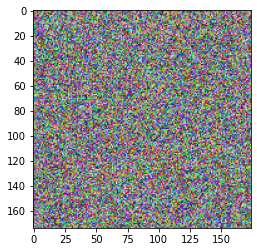

In [134]:
analyzer = LayerAnalyzer(model, "block5_conv1")
plt.imshow(deprocess_image(analyzer.generate_filter_pattern(377, iterations=400)))

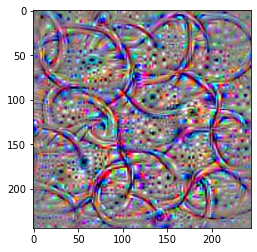

In [143]:
import cv2
plt.imshow(cv2.resize(deproc_image, (244,244)))